# Part1

# Traditional Methods (Non-AI)

Firstly, to increase the resolution of an image, lets use traditional non-AI methods to see how image is effected.

In [2]:
from skimage.io import imread, imshow
import matplotlib.pyplot as plt

In [3]:
sample_image = "/Users/esmasert/Desktop/Streama/image1.png"
sample_image2 = "/Users/esmasert/Desktop/Streama/image2.png"
# read the image using skimage
imm = imread(sample_image)
imm2 = imread(sample_image2)

In [4]:
print(imm.shape)
print(imm2.shape)

(630, 1036, 4)
(1512, 1564, 4)


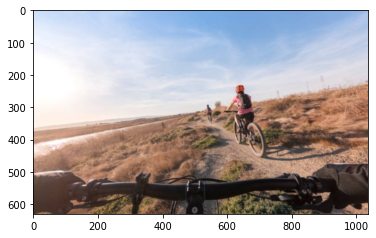

In [5]:
plt.imshow(imm)

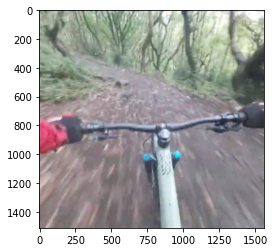

In [6]:
plt.imshow(imm2)

In most of the methods, when I use the image for any operation, I came accross the warning because of test images shape[2] which is 4. That means the image is in RGBA format. So almost for every operation, first I needed to convert the image into RGB type from RGBA. 

To do that:

In [8]:
import cv2
imageRGB = cv2.cvtColor(imm, cv2.COLOR_BGRA2BGR)
imageRGB2 = cv2.cvtColor(imm2, cv2.COLOR_BGRA2BGR)

In [9]:
print(imageRGB.shape)
print(imageRGB2.shape)

(630, 1036, 3)
(1512, 1564, 3)


Because image is an array, we can use cv2 instead of PIL to resize.

Interpolation technique is a method to estimate the 'unknown' data points between two 'known' data points in an image. It is mostly used to fill missing values in the dataframe while preprocessing data.
Default interpolation is INTER_LINEAR, a bilinear interpolation.

In [27]:
fixed_height = 1000

height_percent = (fixed_height / float(imageRGB.shape[0]))
width_size = int((float(imageRGB.shape[1]) * float(height_percent)))
dim = (width_size, fixed_height)

imageResized = cv2.resize(imageRGB, dim)
imageResized.shape

(1000, 1644, 3)

In [31]:
fixed_height = 1000

height_percent = (fixed_height / float(imageRGB2.shape[0]))
width_size = int((float(imageRGB2.shape[1]) * float(height_percent)))
dim = (width_size, fixed_height)

imageResized2 = cv2.resize(imageRGB2, dim)
imageResized2.shape

(1000, 1034, 3)

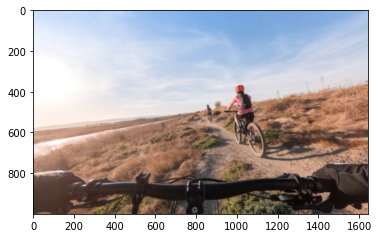

In [32]:
plt.imshow(imageResized)

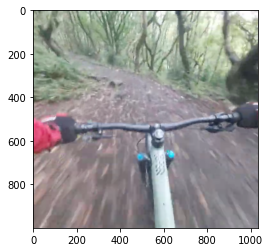

In [33]:
plt.imshow(imageResized2)

As you see, when we enlarged(first image) or shrinked(second image) the images, even the size of images changed, the quality stayed same. This is because; when you normally resize or upscale an image, this just means you expand the pixels of the original image and then fill the gaps by copying the values or taking the means of nearest neighboring pixels.

So it takes us to the point to find the better way to increase resolution and quality of the image. By using Artifical Intelligence Methods and applying novel Deep Learning Architectures, we are able to generate high resolution images. Several models based on deep neural networks have achieved great success in terms of both reconstruction accuracy and computational performance for single image super-resolution.**[1]**

# Resolution with AI

I tried several architectures from researches in chronological order of the articles were published about Super Resolution. In most of these methods, commonly by using bicubic interpolation, the low resolution (LR) input images are created from the high resolution (HR) images. Then they used for training and LR images upscaled to the HR space with deep learning.

I have written brief explanations of some articles about Super Resolution that are important to me. Also, most of the time I used Kaggle and their provided GPU. Training time was almost x10 faster than my computer's CPU. So, to train the models with bigger data, I wrote and run some of my codes on Kaggle notebook.

### Real-Time Single Image and Video Super-Resolution Using an Efficient Sub-Pixel Convolutional Neural Network

Article: https://arxiv.org/abs/1609.05158 

In most of the methods, the low resolution (LR) input image is upscaled to the high resolution (HR) space using a single filter, commonly bicubic interpolation, before reconstruction. This means that the super-resolution (SR) operation is performed in HR space. They demonstrated that this is sub-optimal and adds computational complexity. To address the problem, they proposed to perform the feature extraction stages in LR space instead of HR space. To accomplish it, they presented the first convolutional neural network (CNN) capable of real-time SR of 1080p videos on a single K2 GPU. They proposed a novel CNN architecture where the feature maps are extracted in the LR space. In addition, they introduced an efficient sub-pixel convolution layer which learns an array of upscaling filters to upscale the final LR feature maps into the HR output. Evaluations showed that the model had a significant speed and performance boost compared to the previous CNN approaches with more parameters.

#### Application

In [1]:
import tensorflow as tf

import os
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

In [2]:
dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

70770688/70763455 [==============================] - 112s 2us/step


In [3]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Found 500 files belonging to 1 classes.
Using 100 files for validation.


In [4]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

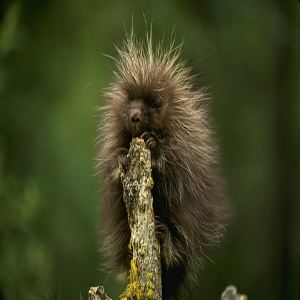

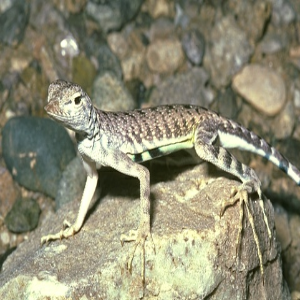

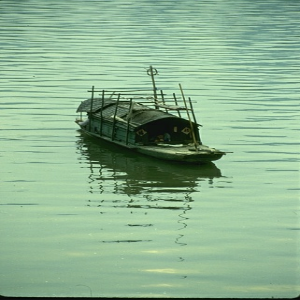

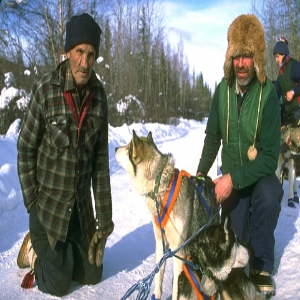

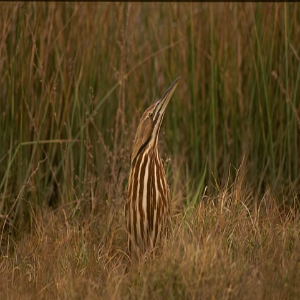

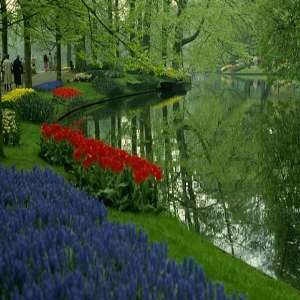

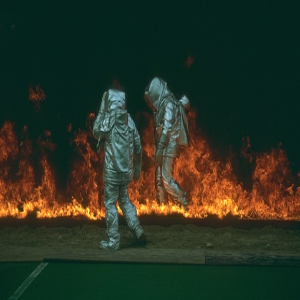

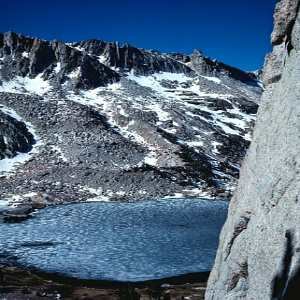

In [5]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

In [6]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

In [7]:

# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

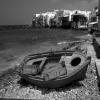

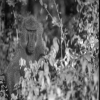

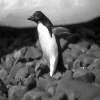

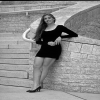

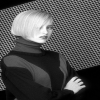

...

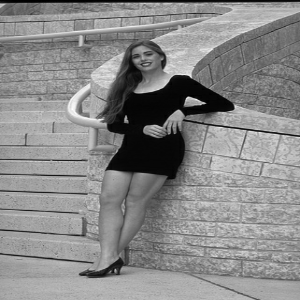

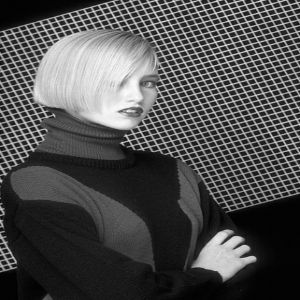

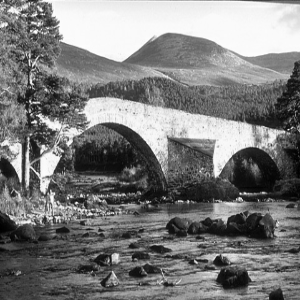

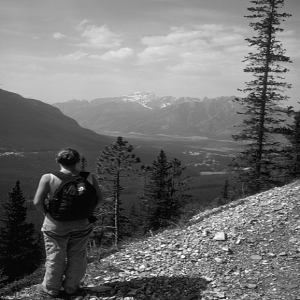

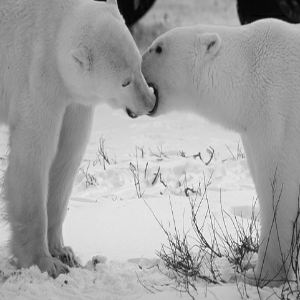

In [8]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

In [9]:

def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)

    return keras.Model(inputs, outputs)


In [10]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img


In [11]:

class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super(ESPCNCallback, self).__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))


In [12]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
conv2d (Conv2D)              (None, None, None, 64)    1664      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    36928     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 32)    18464     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, None, None, 9)     2601      
_________________________________________________________________
tf.nn.depth_to_space (TFOpLa (None, None, None, 1)     0         
Total params: 59,657
Trainable params: 59,657
Non-trainable params: 0
_________________________________________________________

Epoch 1/100
50/50 - 42s - loss: 0.0441 - val_loss: 0.0095
Mean PSNR for epoch: 20.22


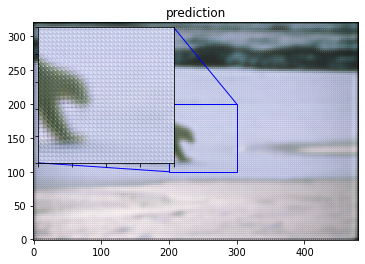

Epoch 2/100
50/50 - 40s - loss: 0.0067 - val_loss: 0.0042
Mean PSNR for epoch: 23.57
Epoch 3/100
50/50 - 40s - loss: 0.0040 - val_loss: 0.0031
Mean PSNR for epoch: 25.27
Epoch 4/100
50/50 - 38s - loss: 0.0032 - val_loss: 0.0027
Mean PSNR for epoch: 26.17
Epoch 5/100
50/50 - 36s - loss: 0.0030 - val_loss: 0.0030
Mean PSNR for epoch: 25.31
Epoch 6/100
50/50 - 28s - loss: 0.0030 - val_loss: 0.0025
Mean PSNR for epoch: 26.20
Epoch 7/100
50/50 - 28s - loss: 0.0028 - val_loss: 0.0025
Mean PSNR for epoch: 26.22
Epoch 8/100
50/50 - 31s - loss: 0.0029 - val_loss: 0.0026
Mean PSNR for epoch: 25.98
Epoch 9/100
50/50 - 28s - loss: 0.0028 - val_loss: 0.0025
Mean PSNR for epoch: 26.33
Epoch 10/100
50/50 - 30s - loss: 0.0028 - val_loss: 0.0025
Mean PSNR for epoch: 26.18
Epoch 11/100
50/50 - 30s - loss: 0.0028 - val_loss: 0.0024
Mean PSNR for epoch: 26.30
Epoch 12/100
50/50 - 29s - loss: 0.0028 - val_loss: 0.0024
Mean PSNR for epoch: 26.02
Epoch 13/100
50/50 - 29s - loss: 0.0028 - val_loss: 0.0025
Mea

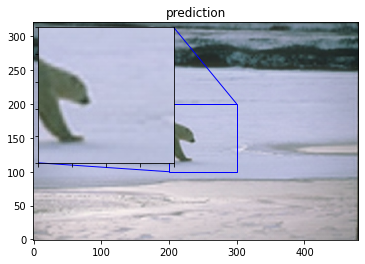

Epoch 22/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0024
Mean PSNR for epoch: 26.21
Epoch 23/100
50/50 - 28s - loss: 0.0029 - val_loss: 0.0024
Mean PSNR for epoch: 26.57
Epoch 24/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.65
Epoch 25/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 27.01
Epoch 26/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.29
Epoch 27/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 27.17
Epoch 28/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.52
Epoch 29/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.61
Epoch 30/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.40
Epoch 31/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.09
Epoch 32/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.48
Epoch 33/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.

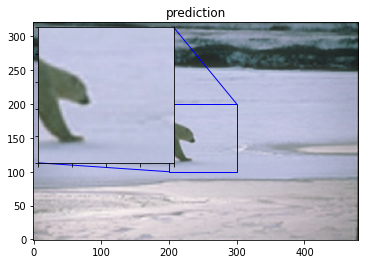

Epoch 42/100
50/50 - 29s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.66
Epoch 43/100
50/50 - 29s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.80
Epoch 44/100
50/50 - 29s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.83
Epoch 45/100
50/50 - 29s - loss: 0.0026 - val_loss: 0.0026
Mean PSNR for epoch: 25.94
Epoch 46/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.23
Epoch 47/100
50/50 - 29s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.56
Epoch 48/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0023
Mean PSNR for epoch: 26.32
Epoch 49/100
50/50 - 29s - loss: 0.0025 - val_loss: 0.0023
Mean PSNR for epoch: 26.50
Epoch 50/100
50/50 - 28s - loss: 0.0026 - val_loss: 0.0024
Mean PSNR for epoch: 26.13
Epoch 51/100
50/50 - 28s - loss: 0.0027 - val_loss: 0.0023
Mean PSNR for epoch: 26.67
Epoch 52/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0023
Mean PSNR for epoch: 26.44
Epoch 53/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.

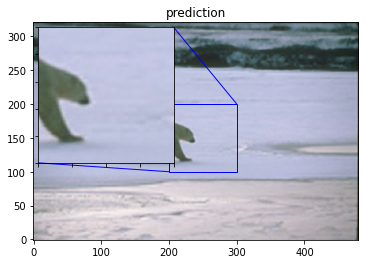

Epoch 62/100
50/50 - 43s - loss: 0.0025 - val_loss: 0.0023
Mean PSNR for epoch: 26.22
Epoch 63/100
50/50 - 45s - loss: 0.0025 - val_loss: 0.0023
Mean PSNR for epoch: 26.34
Epoch 64/100
50/50 - 46s - loss: 0.0025 - val_loss: 0.0023
Mean PSNR for epoch: 27.31
Epoch 65/100
50/50 - 42s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.86
Epoch 66/100
50/50 - 40s - loss: 0.0027 - val_loss: 0.0025
Mean PSNR for epoch: 25.96
Epoch 67/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.66
Epoch 68/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.69
Epoch 69/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.44
Epoch 70/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0023
Mean PSNR for epoch: 26.68
Epoch 71/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0023
Mean PSNR for epoch: 26.68
Epoch 72/100
50/50 - 30s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.87
Epoch 73/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.

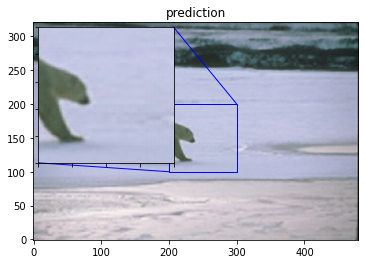

Epoch 82/100
50/50 - 29s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.61
Epoch 83/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.83
Epoch 84/100
50/50 - 29s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.68
Epoch 85/100
50/50 - 37s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.82
Epoch 86/100
50/50 - 47s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.17
Epoch 87/100
50/50 - 41s - loss: 0.0025 - val_loss: 0.0023
Mean PSNR for epoch: 26.39
Epoch 88/100
50/50 - 34s - loss: 0.0027 - val_loss: 0.0029
Mean PSNR for epoch: 25.27
Epoch 89/100
50/50 - 28s - loss: 0.0030 - val_loss: 0.0023
Mean PSNR for epoch: 26.49
Epoch 90/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.35
Epoch 91/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.32
Epoch 92/100
50/50 - 28s - loss: 0.0025 - val_loss: 0.0022
Mean PSNR for epoch: 26.83
Epoch 93/100
50/50 - 29s - loss: 0.0025 - val_loss: 0.

In [13]:
epochs = 100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

In [15]:
model.save('/Users/esmasert/Desktop/Streama/savedModels/EffSubPxlCNN')

INFO:tensorflow:Assets written to: /Users/esmasert/Desktop/Streama/savedModels/EffSubPxlCNN/assets


In [17]:
new_model = tf.keras.models.load_model('/Users/esmasert/Desktop/Streama/savedModels/EffSubPxlCNN')

# Check its architecture
new_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
conv2d (Conv2D)              (None, None, None, 64)    1664      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    36928     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 32)    18464     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, None, None, 9)     2601      
_________________________________________________________________
tf.nn.depth_to_space (TFOpLa (None, None, None, 1)     0         
Total params: 59,657
Trainable params: 59,657
Non-trainable params: 0
_________________________________________________________

OOLAAA
(160, 107)
PSNR of low resolution image and high resolution image is 29.8502
PSNR of predict and high resolution is 30.4632


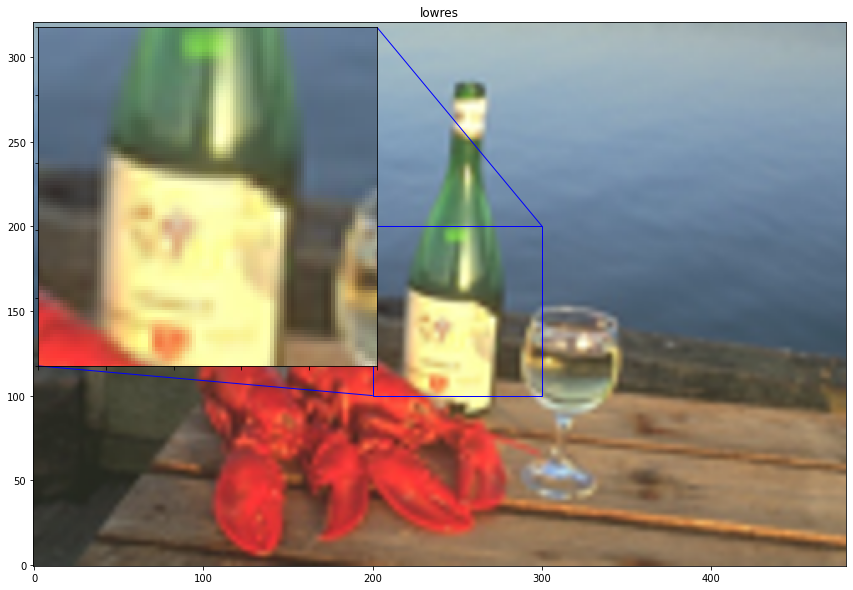

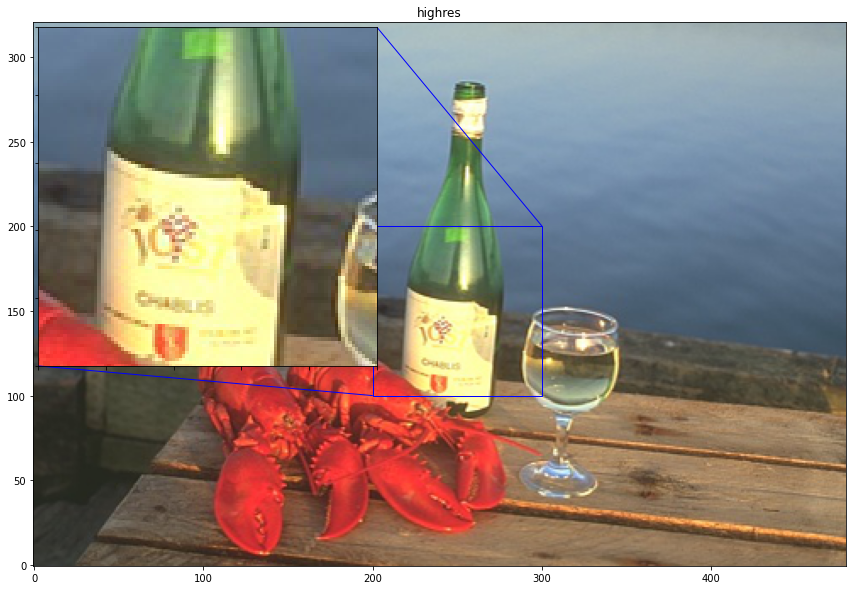

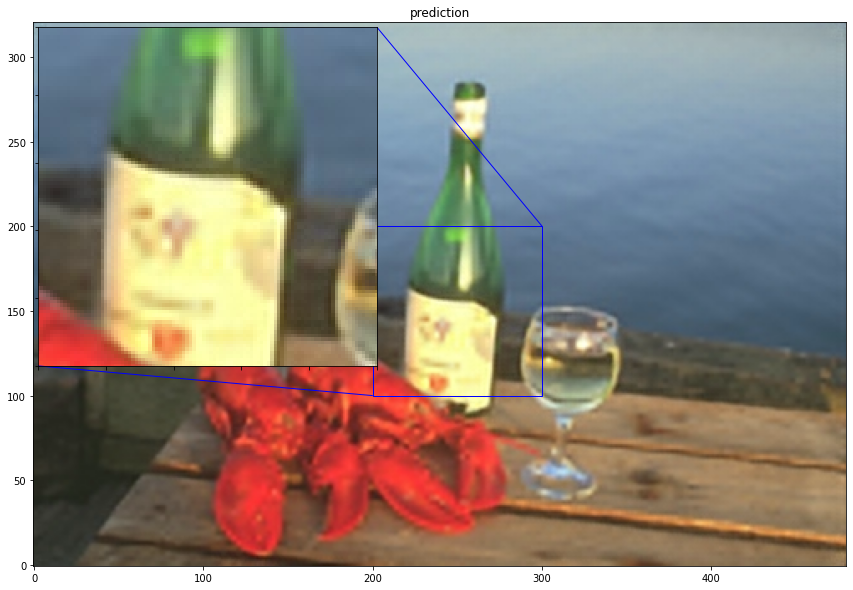

OOLAAA
(160, 107)
PSNR of low resolution image and high resolution image is 24.9783
PSNR of predict and high resolution is 25.9386


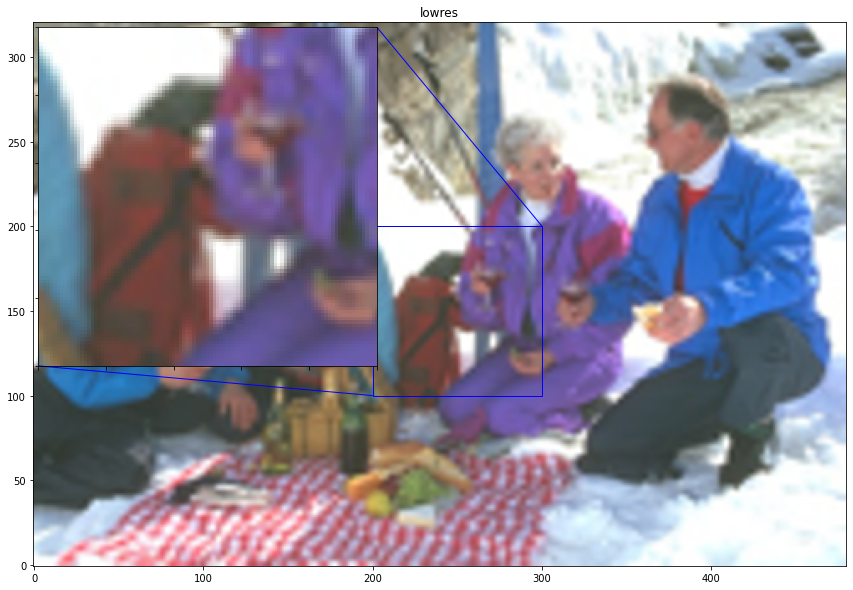

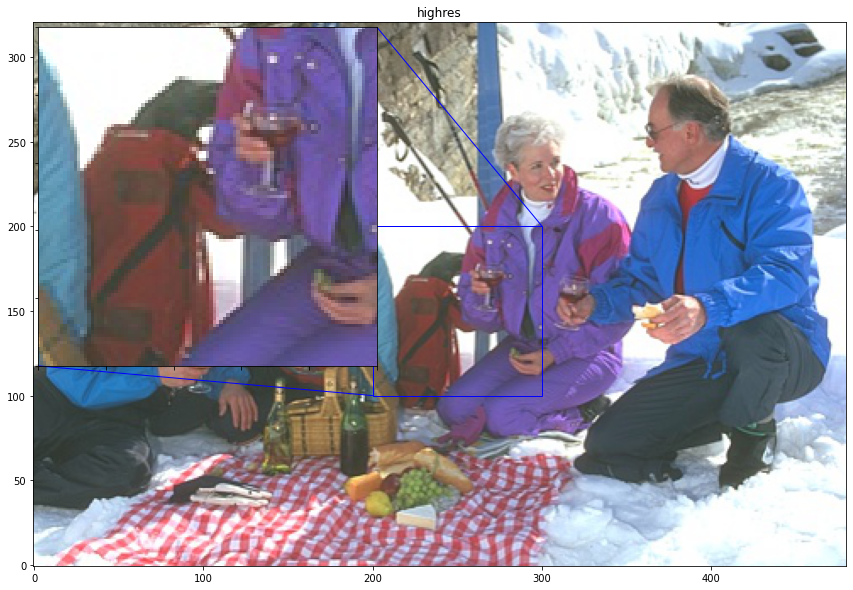

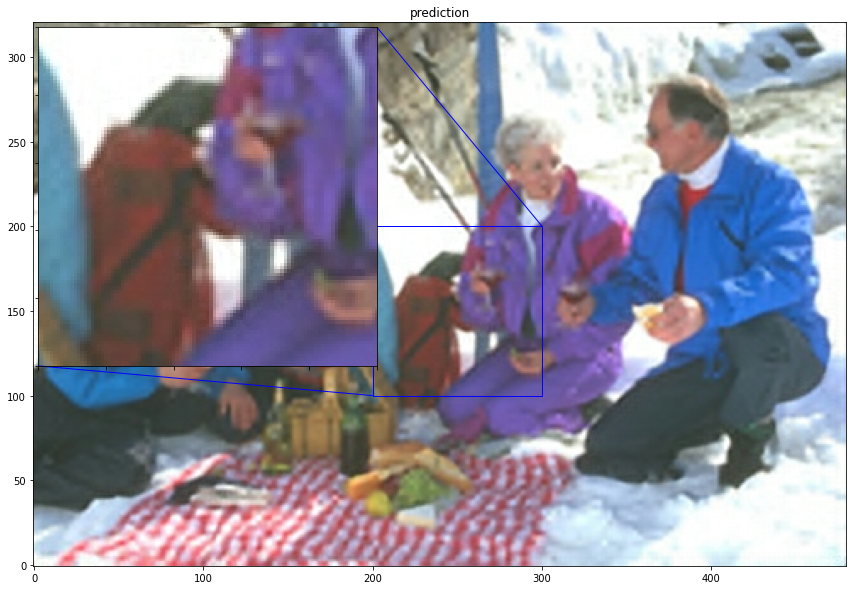

OOLAAA
(107, 160)
PSNR of low resolution image and high resolution image is 27.7724
PSNR of predict and high resolution is 28.3744


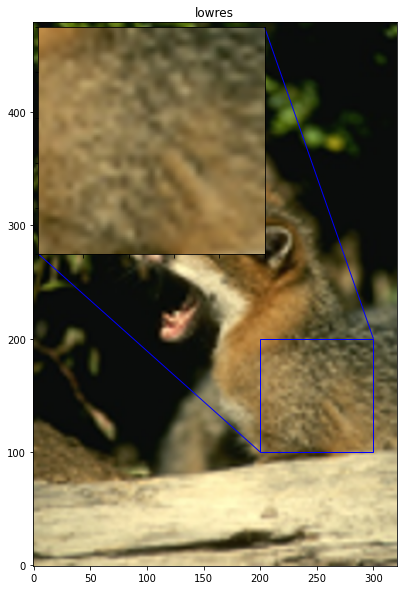

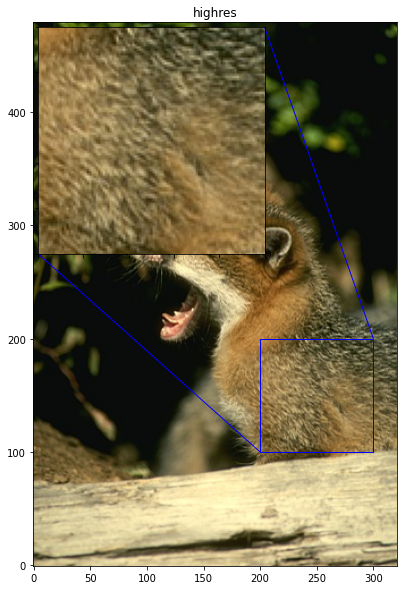

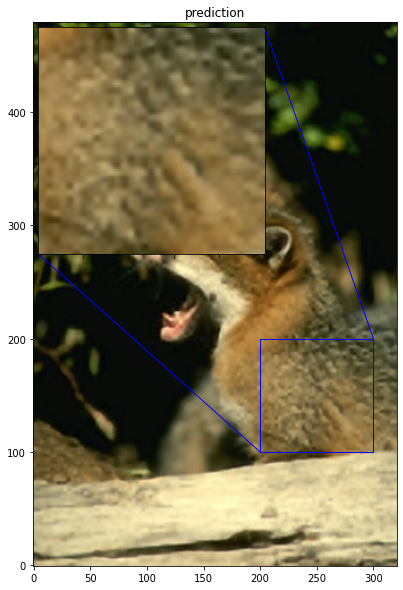

OOLAAA
(160, 107)
PSNR of low resolution image and high resolution image is 28.0314
PSNR of predict and high resolution is 28.3006


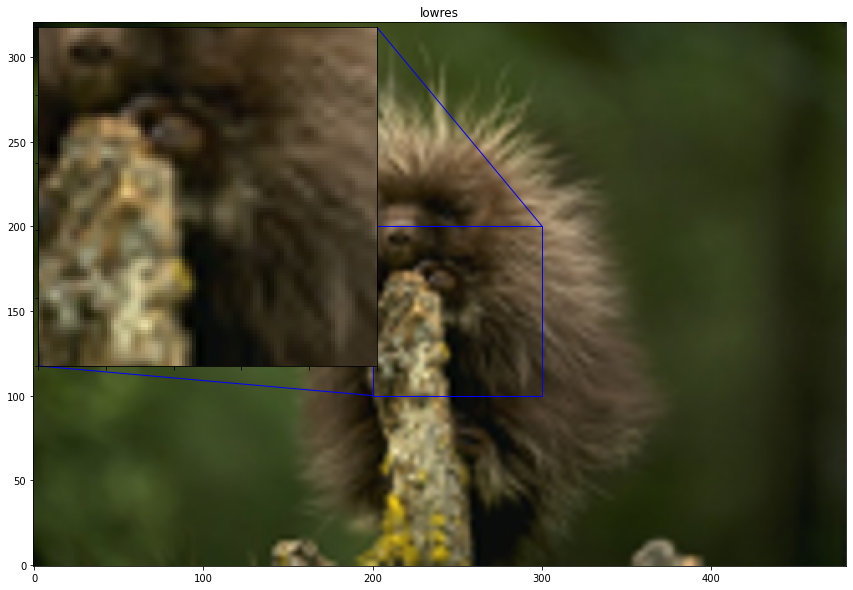

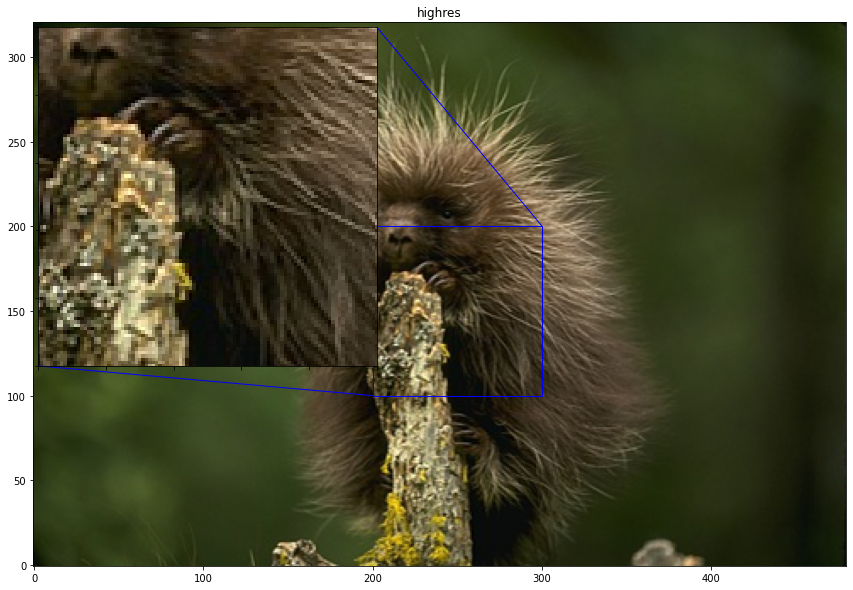

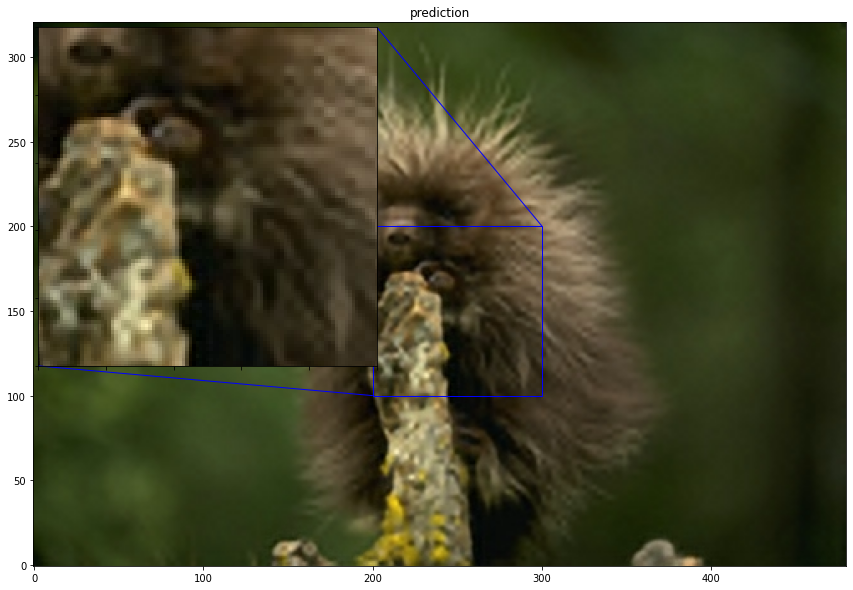

OOLAAA
(160, 107)
PSNR of low resolution image and high resolution image is 25.7630
PSNR of predict and high resolution is 26.3620


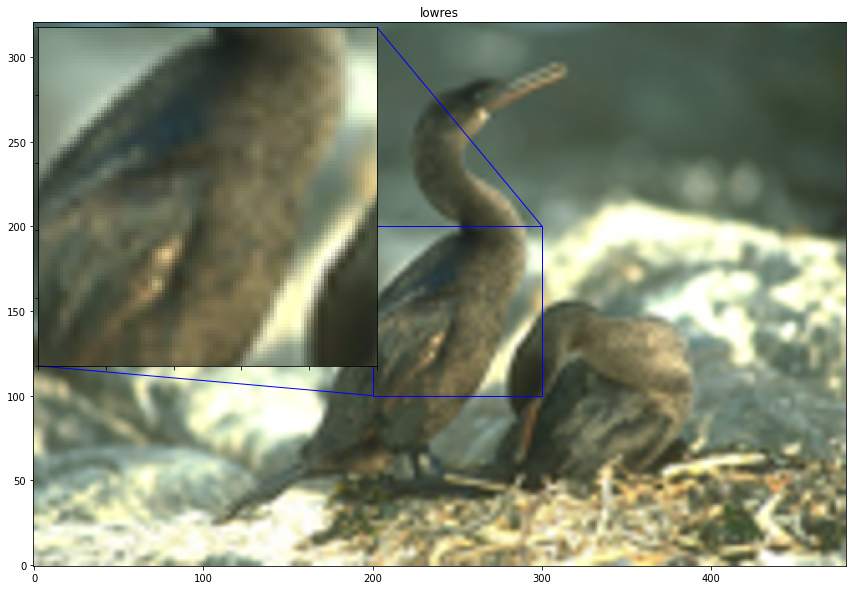

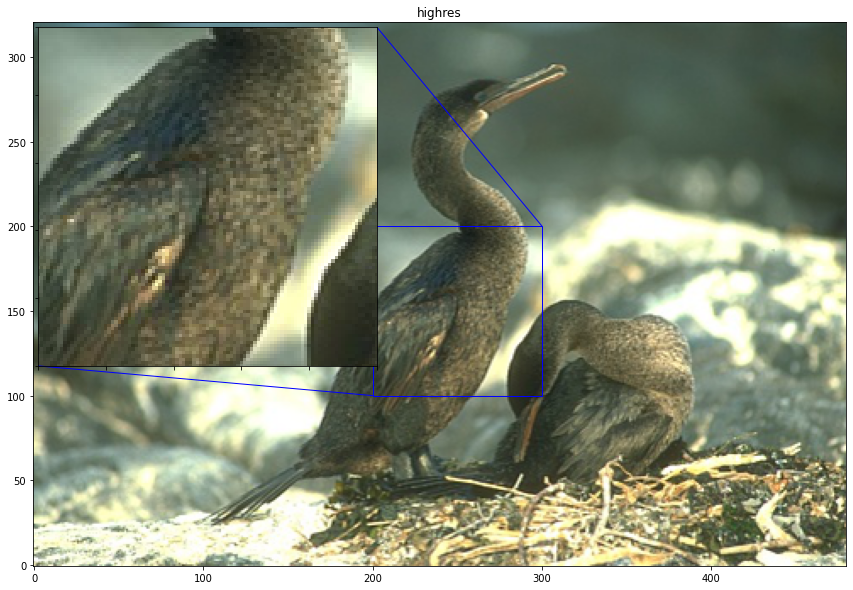

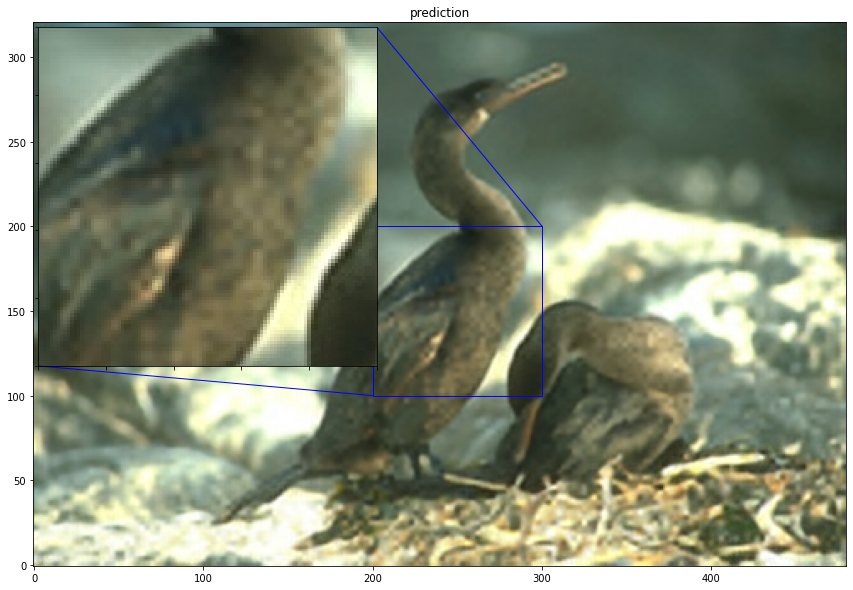

OOLAAA
(160, 107)
PSNR of low resolution image and high resolution image is 25.7874
PSNR of predict and high resolution is 26.5703


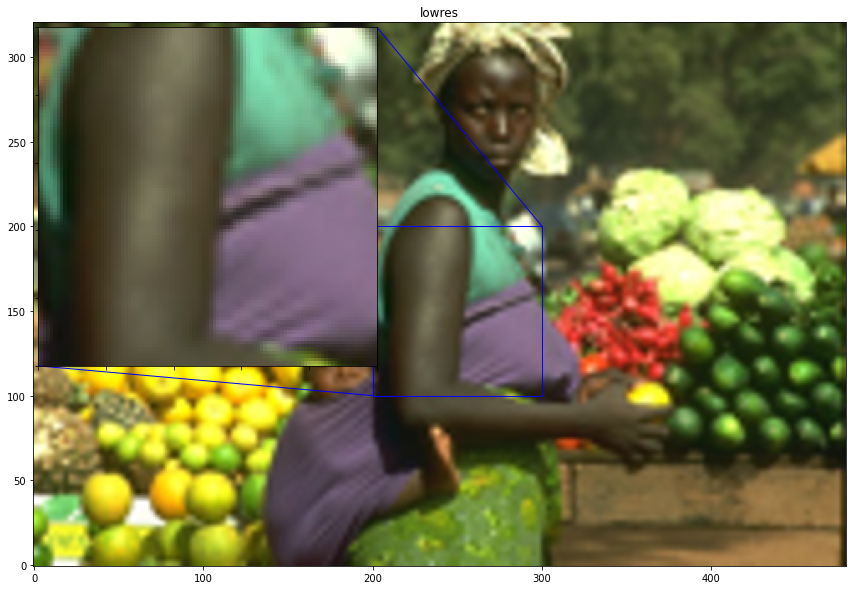

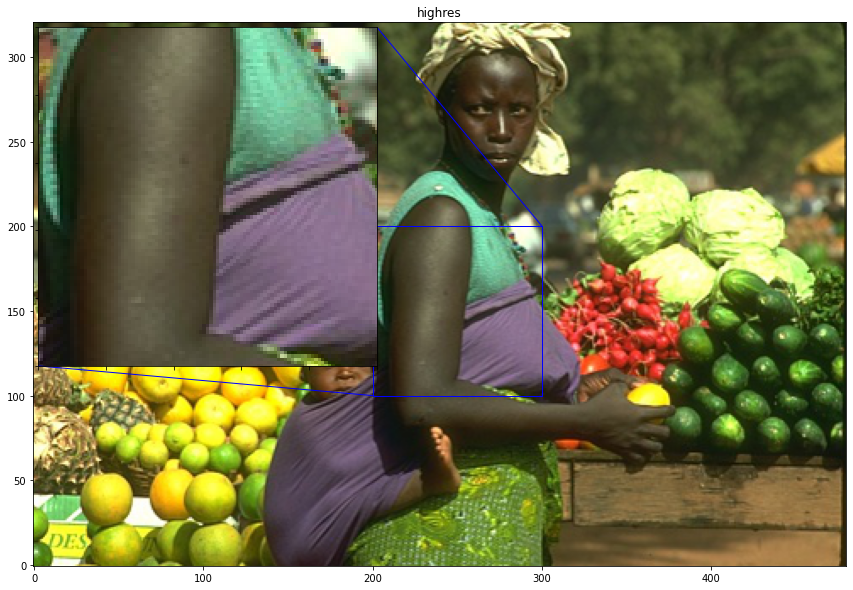

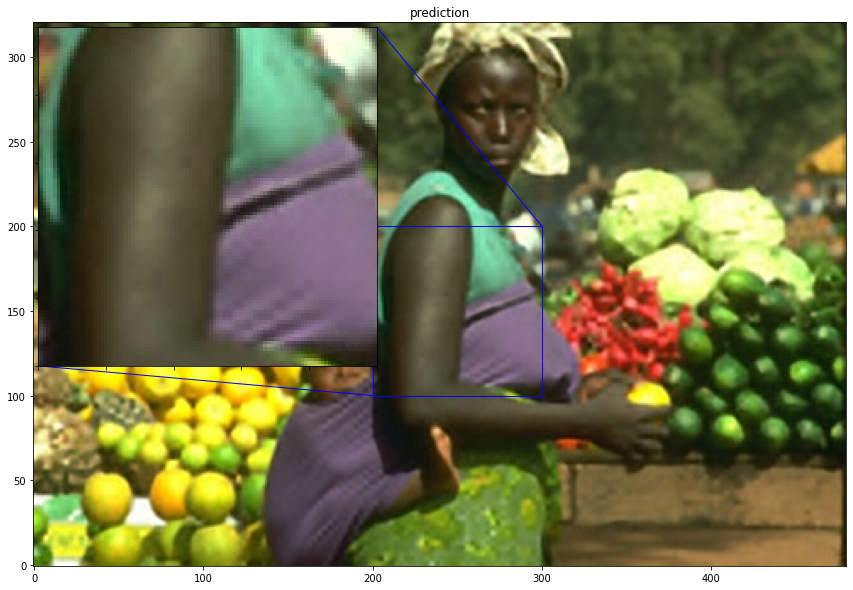

OOLAAA
(160, 107)
PSNR of low resolution image and high resolution image is 26.2512
PSNR of predict and high resolution is 27.1755


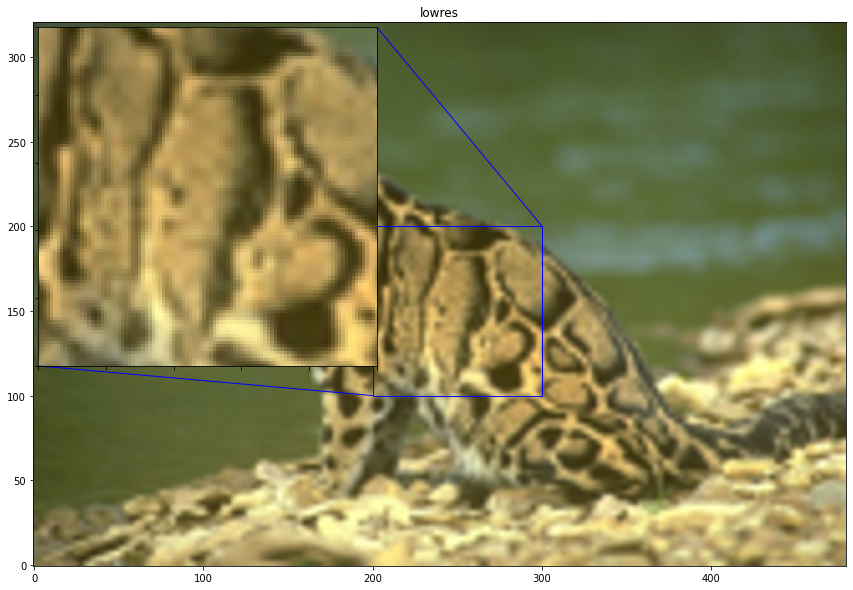

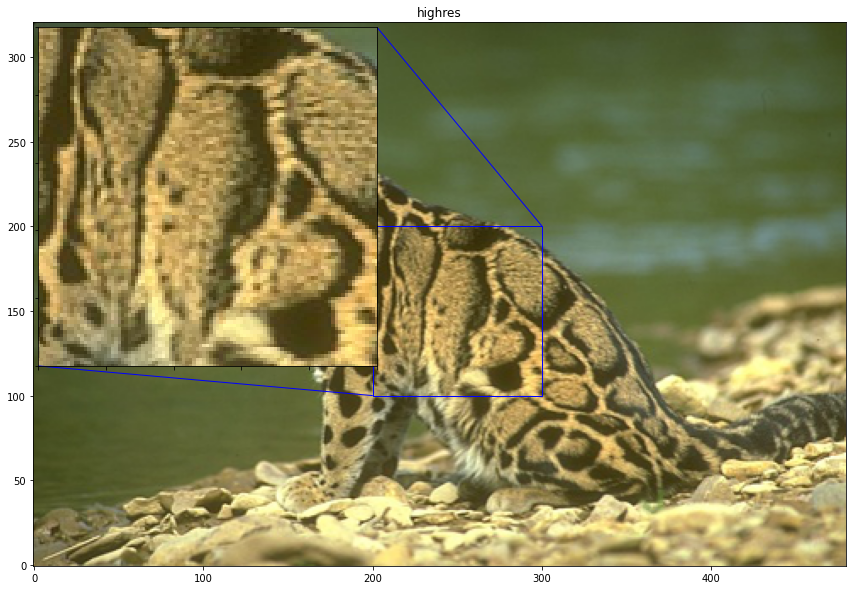

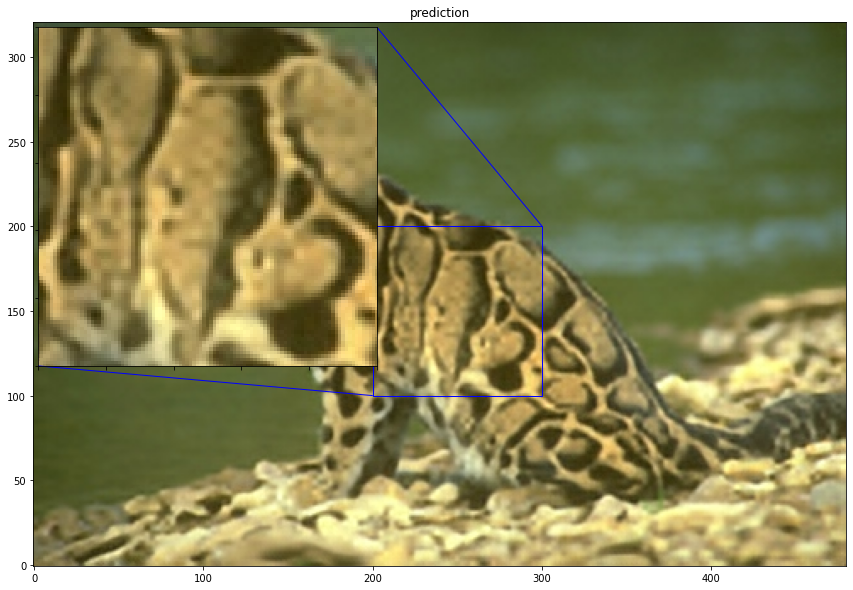

OOLAAA
(160, 107)
PSNR of low resolution image and high resolution image is 23.3820
PSNR of predict and high resolution is 24.7143


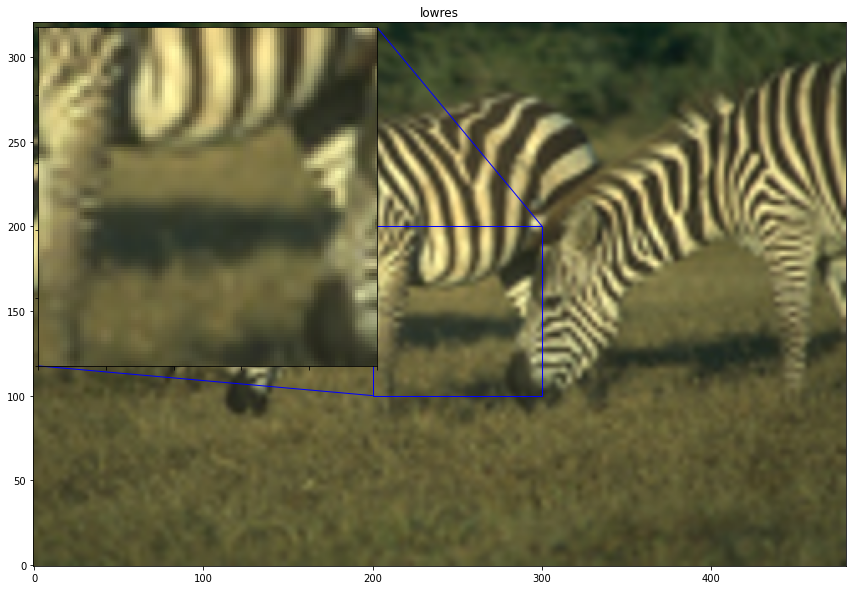

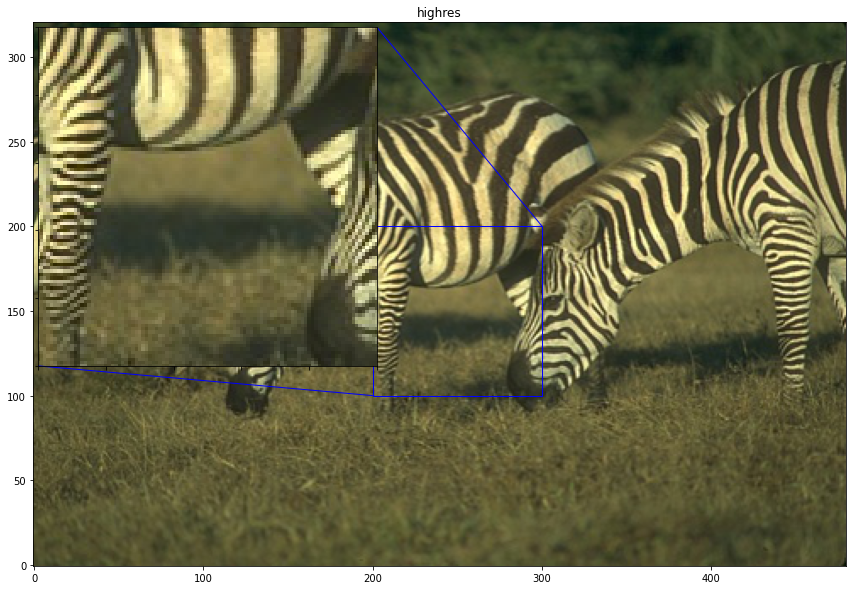

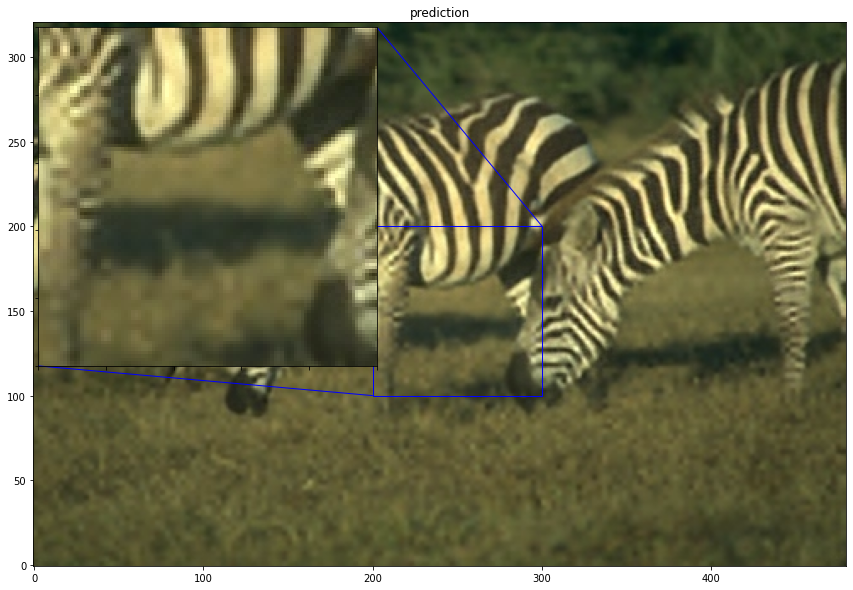

OOLAAA
(160, 107)
PSNR of low resolution image and high resolution image is 29.8914
PSNR of predict and high resolution is 30.1162


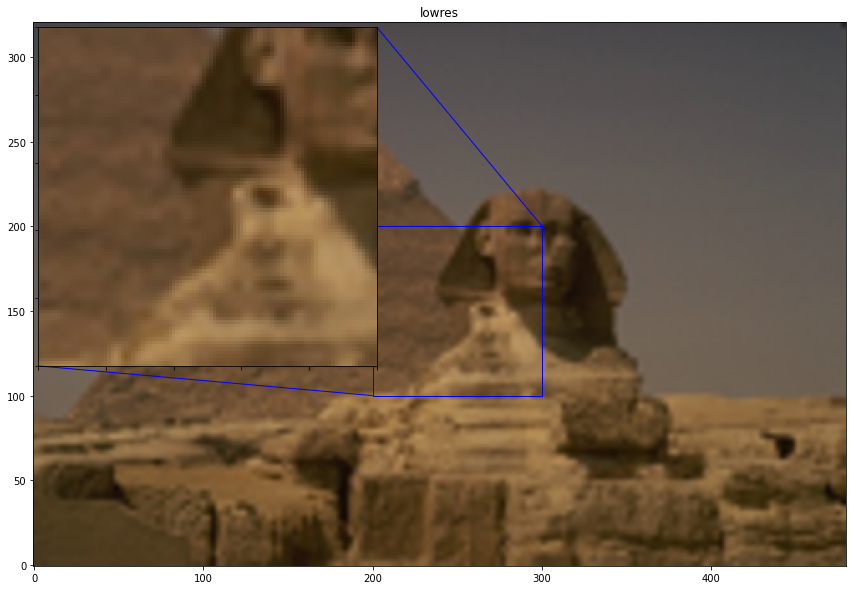

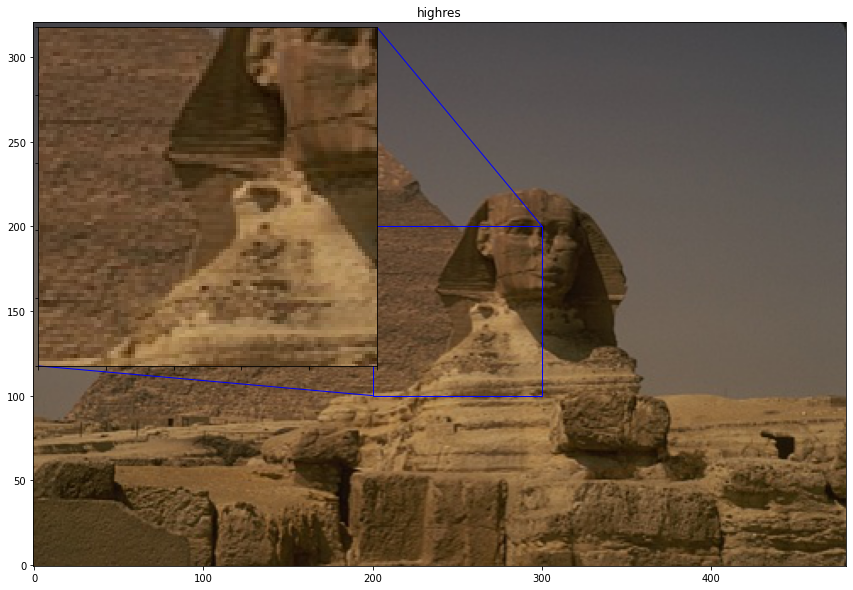

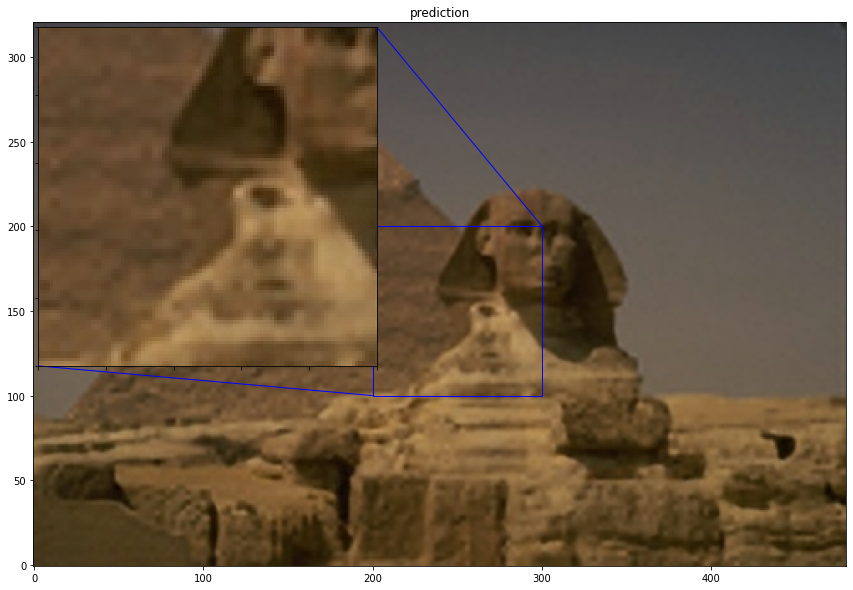

OOLAAA
(107, 160)
PSNR of low resolution image and high resolution image is 25.1712
PSNR of predict and high resolution is 25.6905


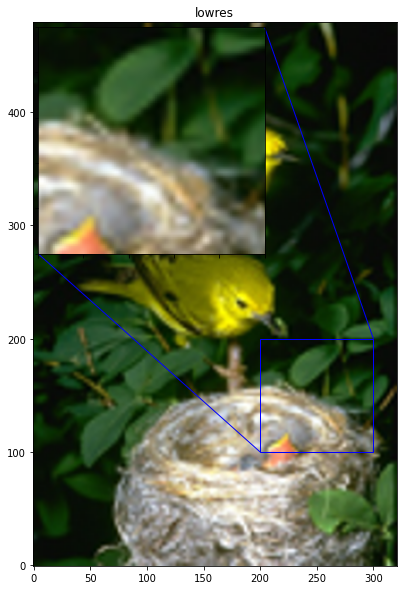

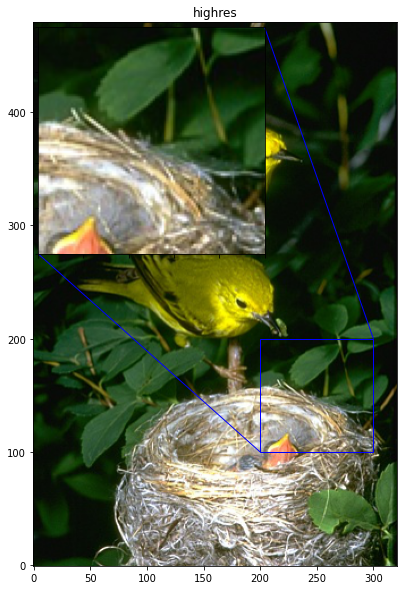

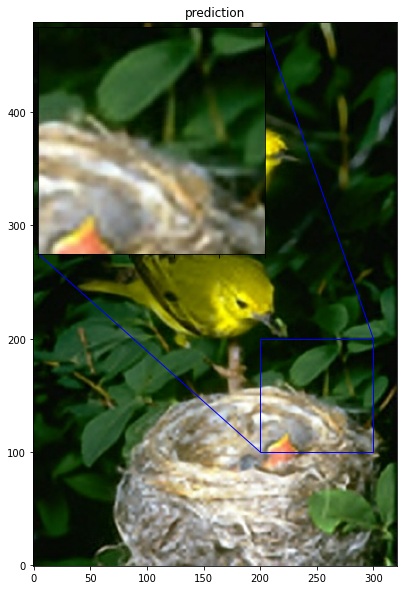

Avg. PSNR of lowres images is 26.6879
Avg. PSNR of reconstructions is 27.3706


In [33]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))

In [142]:
testdnm = "/Users/esmasert/Desktop/Streama/ss1.png"

In [143]:
img = load_img(testdnm)

In [38]:
img.size

(1036, 630)

In [47]:
lowres_input = get_lowres_image(img, upscale_factor)
prediction = upscale_image(model, lowres_input)

In [67]:
prediction2 = upscale_image(model, img)

In [40]:
plt.rcParams['figure.figsize'] = [15, 10]

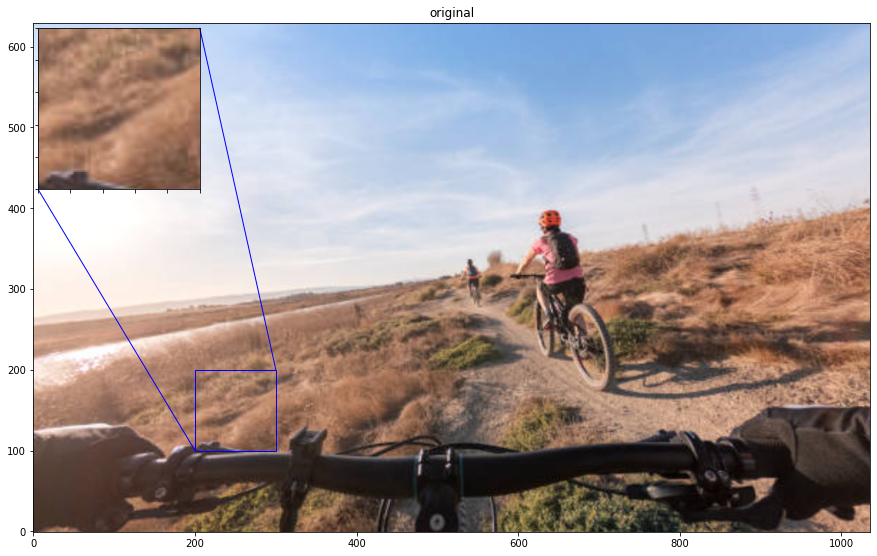

In [28]:
plot_results(img, index, "original")

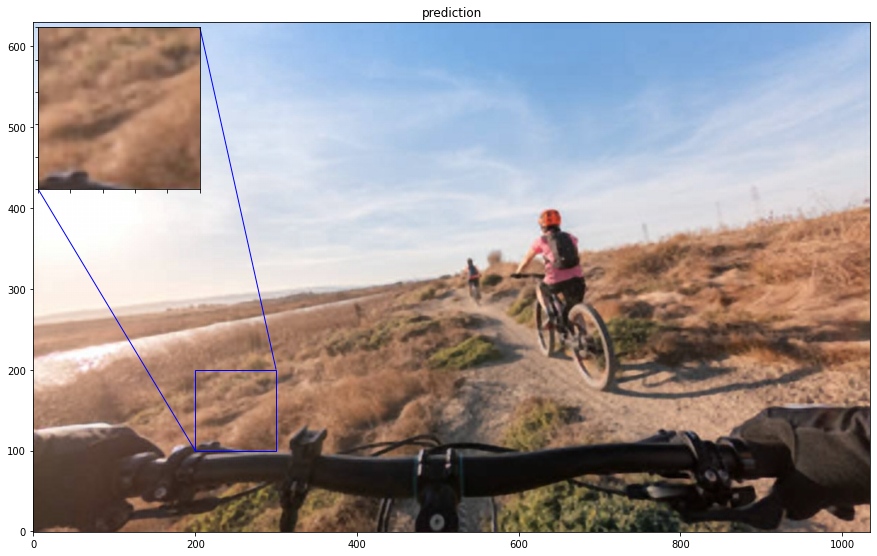

In [29]:
plot_results(prediction, index, "prediction")